In [2]:
#Instalamos librería para análisis de variables categóricas
%pip install funpymodeling

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from funpymodeling.exploratory import freq_tbl

In [4]:
#Cargar archivo csv desde equipo
from google.colab import files
files.upload()

Saving Datos_limpios_Amsterdam.csv to Datos_limpios_Amsterdam.csv


{'Datos_limpios_Amsterdam.csv': b',last_scraped,name,description,neighborhood_overview,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,property_type,room_type,amenities,price,calendar_updated,has_availability,last_review,review_scores_rating,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_value,instant_bookable,reviews_per_month,latitude,longitude,accommodates,bathrooms,bedrooms,beds,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_location\r\n0,2024-09-05,"Warm, cozy sunlighted downtown appt",2 room appt. 1.8 km from central station with nice sunn

In [23]:
#Carga desde un archivo .xlsx sin indice
df=pd.read_csv('Datos_limpios_Amsterdam.csv')

In [24]:
#Verificamos la informacion del dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9659 entries, 0 to 9658
Data columns (total 51 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Unnamed: 0                   9659 non-null   int64  
 1   last_scraped                 9659 non-null   object 
 2   name                         9659 non-null   object 
 3   description                  9659 non-null   object 
 4   neighborhood_overview        9659 non-null   object 
 5   host_location                9659 non-null   object 
 6   host_response_time           9659 non-null   object 
 7   host_response_rate           9659 non-null   object 
 8   host_acceptance_rate         9659 non-null   object 
 9   host_is_superhost            9659 non-null   object 
 10  host_verifications           9659 non-null   object 
 11  host_has_profile_pic         9659 non-null   object 
 12  host_identity_verified       9659 non-null   object 
 13  neighbourhood     

In [25]:
#Imprimo los primeros 5 registros del Dataframe
df.head()

,Unnamed: 0,last_scraped,name,description,neighborhood_overview,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,...,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_location
0,0,2024-09-05,"Warm, cozy sunlighted downtown appt",2 room appt. 1.8 km from central station with ...,Nothing to say,"Amsterdam, Netherlands",within an hour,100%,Without information,f,...,2.0,1125.0,0.0,0.0,0,0,43.0,0.0,0.0,4.56
1,1,2024-09-05,Cozy apartment in city center,Located in Amsterdam's sweet spot. A stone's t...,see the guide,"Chicago, IL",within an hour,100%,Without information,f,...,2.0,1125.0,0.0,0.0,0,0,0.0,0.0,0.0,4.56
2,2,2024-09-05,Loft style home nearby city centre,Located in Amsterdam's sweet spot. A stone's t...,Nothing to say,"Amsterdam, Netherlands",within an hour,100%,100%,f,...,2.4,1125.0,0.0,0.0,0,1,13.4,8.0,0.3,4.66
3,3,2024-09-06,Geweldige duurzame eco woonark op unieke plek!,This unique eco houseboat is located in the mo...,Nothing to say,"Amsterdam, Netherlands",within a few hours,100%,Without information,f,...,3.0,21.0,0.0,0.0,0,0,1.0,0.0,0.0,5.00
4,4,2024-09-05,Old bar apartment,This just renovated apartment for 6 persons is...,Our apartment is situated in the centre of Ams...,Not filled yet,within a few hours,100%,86%,f,...,1.0,1125.0,6.0,18.0,48,191,13.4,2.9,2.0,4.83


In [27]:
freq_tbl(df)

  last_scraped  frequency  percentage  cumulative_perc
0   2024-09-05       5039     0.52169          0.52169
1   2024-09-06       4620     0.47831          1.00000

----------------------------------------------------------------

                                                   name  frequency  \
0                              Appartement in Amsterdam         15   
1                                Apartment in Amsterdam         14   
2                           Cozy apartment in Amsterdam          8   
3                         Lovely apartment in Amsterdam          8   
4                      Cozy apartment in Amsterdam West          7   
...                                                 ...        ...   
9432                Bright apartment next to Vondelpark          1   
9433  Lovely family home in green oasis @ upcoming N...          1   
9434                  Modern entire apartment Amsterdam          1   
9435         Bright apartment in the heart of Amsterdam          1  

In [346]:
table= freq_tbl(df['host_response_rate'])
table

,host_response_rate,frequency,percentage,cumulative_perc
0,100%,7662,0.793250,0.793250
1,90%,275,0.028471,0.821721
2,0%,176,0.018221,0.839942
3,50%,143,0.014805,0.854747
4,80%,129,0.013355,0.868102
...,...,...,...,...
58,7%,1,0.000104,0.999586
59,66%,1,0.000104,0.999689
60,64%,1,0.000104,0.999793
61,55%,1,0.000104,0.999896


In [351]:
#Elimina las columnas "percentage" y "cumulative_perc"
tables= table.drop(['percentage','cumulative_perc'], axis=1)
tables

,host_response_rate,frequency
0,100%,7662
1,90%,275
2,0%,176
3,50%,143
4,80%,129
...,...,...
58,7%,1
59,66%,1
60,64%,1
61,55%,1


In [352]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
tables= tables[tables['frequency']>100]
tables

,host_response_rate,frequency
0,100%,7662
1,90%,275
2,0%,176
3,50%,143
4,80%,129
5,96%,106
6,98%,102


In [354]:
#Ajusto el indice de mi dataframe
tables= tables.set_index('host_response_rate')
tables

,frequency
host_response_rate,
100%,7662
90%,275
0%,176
50%,143
80%,129
96%,106
98%,102


<Axes: ylabel='frequency'>

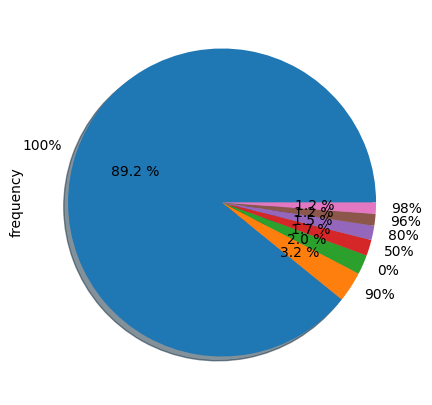

In [355]:
#Realizamos grafico de pastel
tables["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [34]:
table1= freq_tbl(df['host_acceptance_rate'])
table1

,host_acceptance_rate,frequency,percentage,cumulative_perc
0,100%,2528,0.261725,0.261725
1,Without information,1824,0.188839,0.450564
2,0%,466,0.048245,0.498809
3,99%,420,0.043483,0.542292
4,50%,386,0.039963,0.582255
...,...,...,...,...
96,34%,5,0.000518,0.998861
97,76%,5,0.000518,0.999379
98,51%,3,0.000311,0.999689
99,49%,2,0.000207,0.999896


In [356]:
#Elimina las columnas "percentage" y "cumulative_perc"
table1= table1.drop(['percentage','cumulative_perc'], axis=1)
table1

,host_acceptance_rate,frequency
0,100%,2528
1,Without information,1824
2,0%,466
3,99%,420
4,50%,386
...,...,...
96,34%,5
97,76%,5
98,51%,3
99,49%,2


In [357]:
#Ajusto el indice de mi dataframe
table1= table1.set_index('host_acceptance_rate')
table1

,frequency
host_acceptance_rate,
100%,2528
Without information,1824
0%,466
99%,420
50%,386
...,...
34%,5
76%,5
51%,3


In [360]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table1= table1[table1['frequency']>350]
table1

,frequency
host_acceptance_rate,
100%,2528
Without information,1824
0%,466
99%,420
50%,386


Text(0, 0.5, 'Frecuencia')

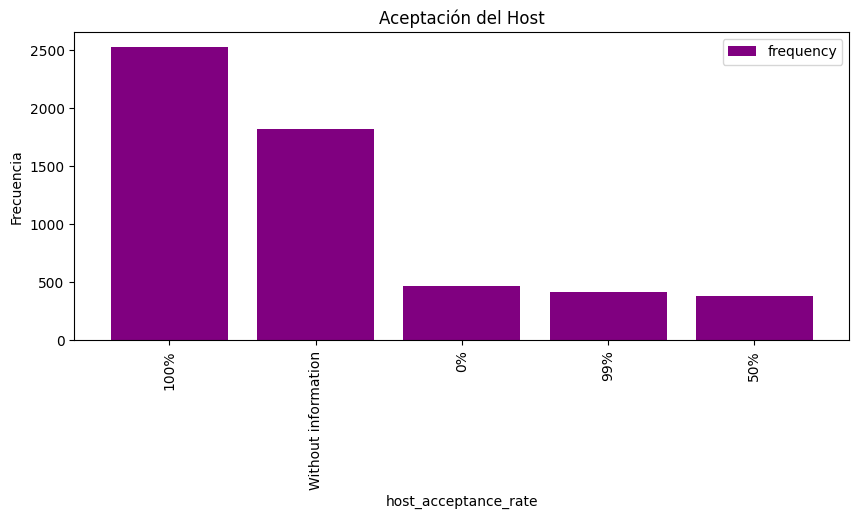

In [362]:
#Personalizamos grafico de barras
table1.plot(kind= 'bar', width=0.8, figsize=(10,4), color="purple")
plt.title('Aceptación del Host')
plt.xlabel('host_acceptance_rate')
plt.ylabel('Frecuencia')

In [44]:
table2= freq_tbl(df['host_is_superhost'])
table2

,host_is_superhost,frequency,percentage,cumulative_perc
0,f,7988,0.827001,0.827001
1,t,1671,0.172999,1.000000


In [363]:
#Elimina las columnas "percentage" y "cumulative_perc"
table2= table2.drop(['percentage','cumulative_perc'], axis=1)
table2

,host_is_superhost,frequency
0,f,7988
1,t,1671


In [364]:
#Ajusto el indice de mi dataframe
table2= table2.set_index('host_is_superhost')
table2

,frequency
host_is_superhost,
f,7988
t,1671


<Axes: ylabel='frequency'>

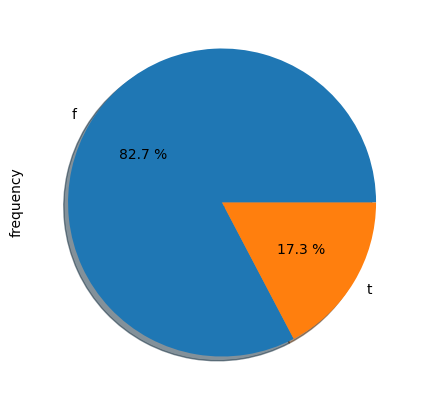

In [366]:
#Realizamos grafico de pastel
table2["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [45]:
table3= freq_tbl(df['host_verifications'])
table3

,host_verifications,frequency,percentage,cumulative_perc
0,"['email', 'phone']",7809,0.808469,0.808469
1,"['email', 'phone', 'work_email']",1036,0.107257,0.915726
2,['phone'],745,0.077130,0.992856
3,"['phone', 'work_email']",29,0.003002,0.995859
4,[],26,0.002692,0.998551
5,['email'],13,0.001346,0.999896
6,"['email', 'work_email']",1,0.000104,1.000000


<Axes: xlabel='frequency', ylabel='cumulative_perc'>

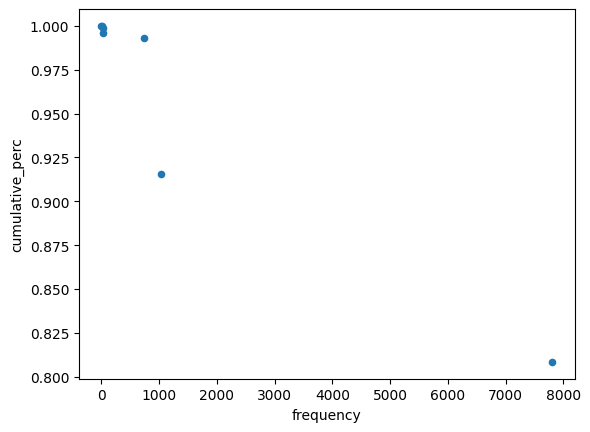

In [367]:
#Realizamos grafico de dispersion del dataframe filtrado
table3.plot("frequency", "cumulative_perc", kind="scatter")

In [46]:
table4= freq_tbl(df['host_identity_verified'])
table4

,host_identity_verified,frequency,percentage,cumulative_perc
0,t,9366,0.969666,0.969666
1,f,293,0.030334,1.000000


In [368]:
#Elimina las columnas "percentage" y "cumulative_perc"
table4= table4.drop(['percentage','cumulative_perc'], axis=1)
table4

,host_identity_verified,frequency
0,t,9366
1,f,293


In [369]:
#Ajusto el indice de mi dataframe
table4= table4.set_index('host_identity_verified')
table4

,frequency
host_identity_verified,
t,9366
f,293


<Axes: ylabel='frequency'>

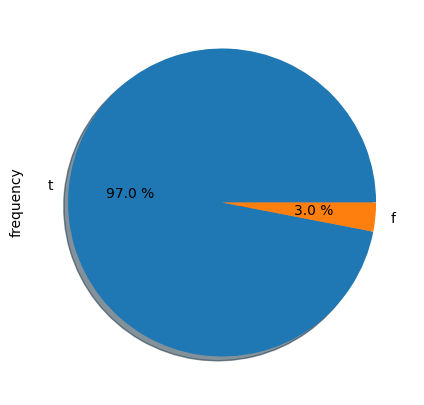

In [370]:
#Realizamos grafico de pastel
table4["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [49]:
table5= freq_tbl(df['neighbourhood'])
table5

,neighbourhood,frequency,percentage,cumulative_perc
0,"Amsterdam, Noord-Holland, Netherlands",4594,0.475619,0.475619
1,Not available,4190,0.433792,0.909411
2,"Amsterdam, North Holland, Netherlands",535,0.055389,0.964800
3,"Amsterdam, NH, Netherlands",199,0.020603,0.985402
4,"Amsterdam, Netherlands",51,0.005280,0.990682
5,"Amsterdam, Nord Holland, Netherlands",14,0.001449,0.992132
6,"Amsterdam-Zuidoost, Noord-Holland, Netherlands",12,0.001242,0.993374
7,"Amsterdam, Noord Holland, Netherlands",11,0.001139,0.994513
8,"Amsterdam-Zuidoost, North Holland, Netherlands",8,0.000828,0.995341
9,"Amsterdam Zuid-Oost, Noord-Holland, Netherlands",3,0.000311,0.995652


In [371]:
#Elimina las columnas "percentage" y "cumulative_perc"
table5= table5.drop(['percentage','cumulative_perc'], axis=1)
table5

,neighbourhood,frequency
0,"Amsterdam, Noord-Holland, Netherlands",4594
1,Not available,4190
2,"Amsterdam, North Holland, Netherlands",535
3,"Amsterdam, NH, Netherlands",199
4,"Amsterdam, Netherlands",51
5,"Amsterdam, Nord Holland, Netherlands",14
6,"Amsterdam-Zuidoost, Noord-Holland, Netherlands",12
7,"Amsterdam, Noord Holland, Netherlands",11
8,"Amsterdam-Zuidoost, North Holland, Netherlands",8
9,"Amsterdam Zuid-Oost, Noord-Holland, Netherlands",3


In [372]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table5= table5[table5['frequency']>14]
table5

,neighbourhood,frequency
0,"Amsterdam, Noord-Holland, Netherlands",4594
1,Not available,4190
2,"Amsterdam, North Holland, Netherlands",535
3,"Amsterdam, NH, Netherlands",199
4,"Amsterdam, Netherlands",51


In [377]:
#Ajusto el indice de mi dataframe
table5= table5.set_index('neighbourhood')
table5

,frequency
neighbourhood,
"Amsterdam, Noord-Holland, Netherlands",4594
Not available,4190
"Amsterdam, North Holland, Netherlands",535
"Amsterdam, NH, Netherlands",199
"Amsterdam, Netherlands",51


Text(0, 0.5, 'Frecuencia')

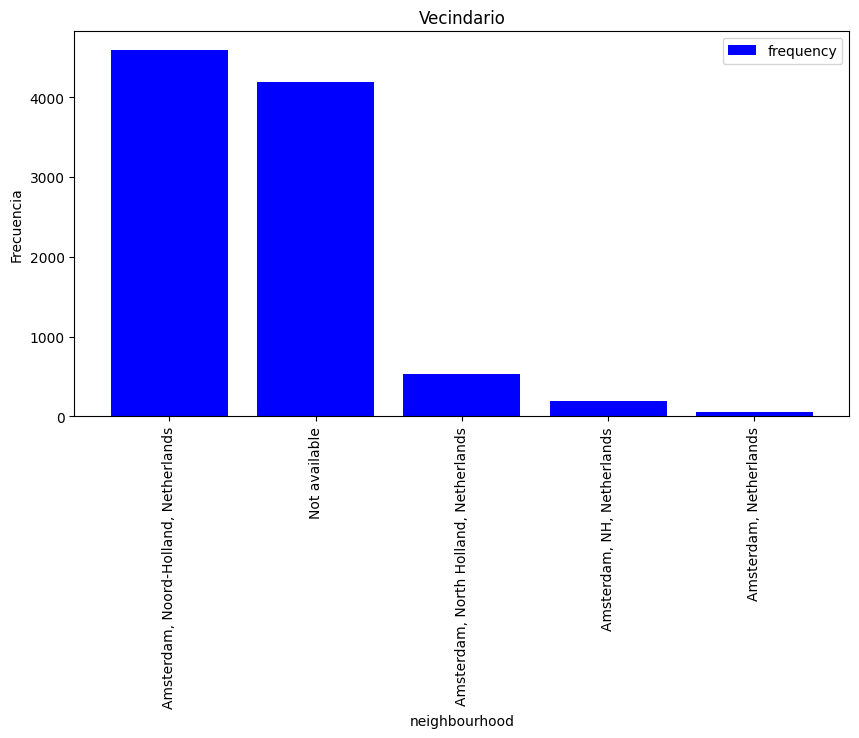

In [378]:
#Personalizamos grafico de barras
table5.plot(kind= 'bar', width=0.8, figsize=(10,5), color="blue")
plt.title('Vecindario')
plt.xlabel('neighbourhood')
plt.ylabel('Frecuencia')

In [50]:
table6= freq_tbl(df['neighbourhood_cleansed'])
table6

,neighbourhood_cleansed,frequency,percentage,cumulative_perc
0,De Baarsjes - Oud-West,1655,0.171343,0.171343
1,De Pijp - Rivierenbuurt,1102,0.114090,0.285433
2,Centrum-West,1084,0.112227,0.397660
3,Centrum-Oost,855,0.088518,0.486179
4,Zuid,671,0.069469,0.555648
5,Westerpark,664,0.068744,0.624392
6,Oud-Oost,596,0.061704,0.686096
7,Bos en Lommer,504,0.052179,0.738275
8,Oud-Noord,457,0.047313,0.785589
9,Oostelijk Havengebied - Indische Buurt,402,0.041619,0.827208


<Axes: xlabel='frequency', ylabel='cumulative_perc'>

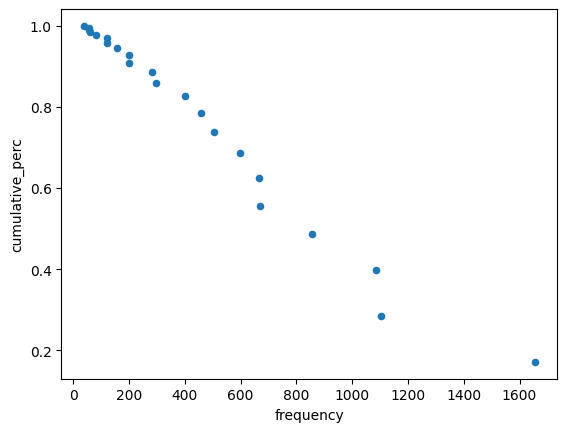

In [379]:
#Realizamos grafico de dispersion del dataframe filtrado
table6.plot("frequency", "cumulative_perc", kind="scatter")

In [51]:
table7= freq_tbl(df['property_type'])
table7

,property_type,frequency,percentage,cumulative_perc
0,Entire rental unit,4118,0.426338,0.426338
1,Entire condo,1674,0.173310,0.599648
2,Entire home,978,0.101253,0.700901
3,Private room in rental unit,438,0.045346,0.746247
4,Private room in bed and breakfast,324,0.033544,0.779791
5,Entire loft,231,0.023916,0.803706
6,Entire townhouse,226,0.023398,0.827104
7,Room in hotel,202,0.020913,0.848017
8,Private room in condo,176,0.018221,0.866239
9,Houseboat,173,0.017911,0.884149


In [380]:
#Elimina las columnas "percentage" y "cumulative_perc"
table7= table7.drop(['percentage','cumulative_perc'], axis=1)
table7

,property_type,frequency
0,Entire rental unit,4118
1,Entire condo,1674
2,Entire home,978
3,Private room in rental unit,438
4,Private room in bed and breakfast,324
5,Entire loft,231
6,Entire townhouse,226
7,Room in hotel,202
8,Private room in condo,176
9,Houseboat,173


In [381]:
#Ajusto el indice de mi dataframe
table7= table7.set_index('property_type')
table7

,frequency
property_type,
Entire rental unit,4118
Entire condo,1674
Entire home,978
Private room in rental unit,438
Private room in bed and breakfast,324
Entire loft,231
Entire townhouse,226
Room in hotel,202
Private room in condo,176


In [385]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table7= table7[table7['frequency']>231]
table7

,frequency
property_type,
Entire rental unit,4118
Entire condo,1674
Entire home,978
Private room in rental unit,438
Private room in bed and breakfast,324


<Axes: ylabel='frequency'>

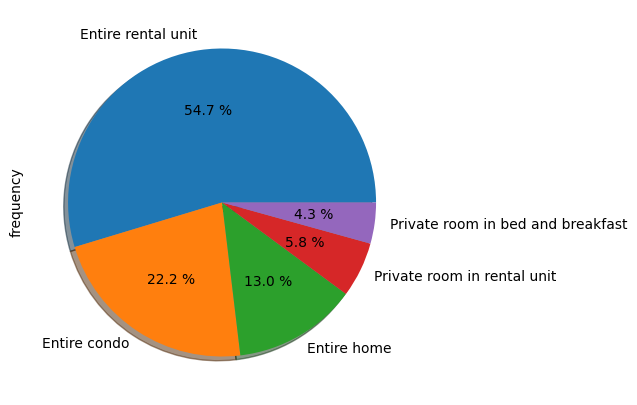

In [386]:
#Realizamos grafico de pastel
table7["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [52]:
table8= freq_tbl(df['room_type'])
table8

,room_type,frequency,percentage,cumulative_perc
0,Entire home/apt,7776,0.805052,0.805052
1,Private room,1789,0.185216,0.990268
2,Hotel room,56,0.005798,0.996066
3,Shared room,38,0.003934,1.000000


In [387]:
#Elimina las columnas "percentage" y "cumulative_perc"
table8= table8.drop(['percentage','cumulative_perc'], axis=1)
table8

,room_type,frequency
0,Entire home/apt,7776
1,Private room,1789
2,Hotel room,56
3,Shared room,38


In [388]:
#Ajusto el indice de mi dataframe
table8= table8.set_index('room_type')
table8

,frequency
room_type,
Entire home/apt,7776
Private room,1789
Hotel room,56
Shared room,38


Text(0, 0.5, 'Frecuencia')

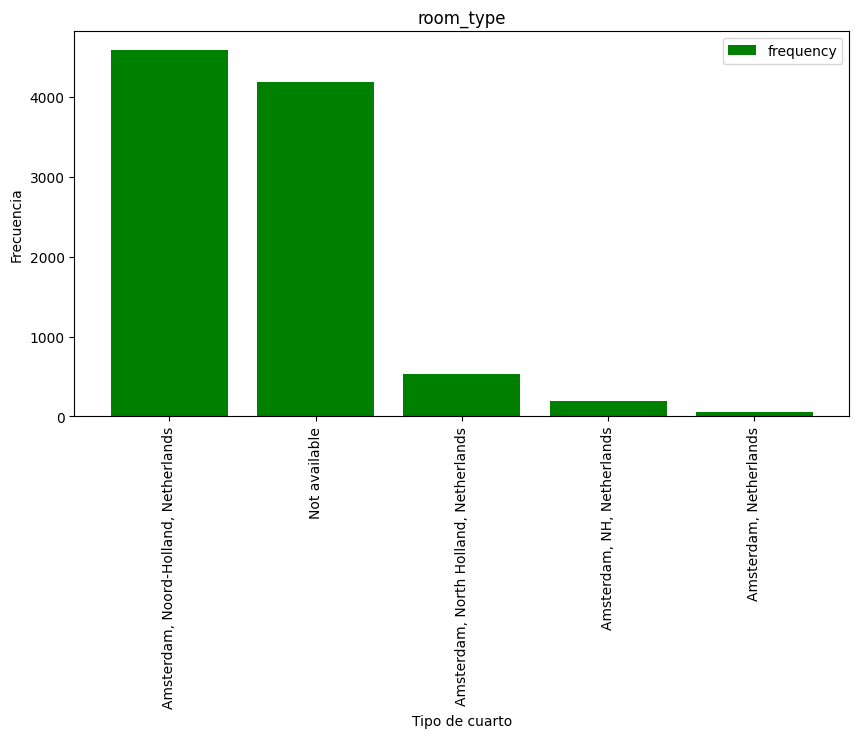

In [390]:
#Personalizamos grafico de barras
table5.plot(kind= 'bar', width=0.8, figsize=(10,5), color="GREEN")
plt.title('room_type')
plt.xlabel('Tipo de cuarto')
plt.ylabel('Frecuencia')

In [53]:
table9= freq_tbl(df['amenities'])
table9

,amenities,frequency,percentage,cumulative_perc
0,"[""Smoke alarm"", ""Washer"", ""TV"", ""Wifi"", ""Kitch...",14,0.001449,0.001449
1,"[""Air conditioning"", ""Smoke alarm"", ""Essential...",9,0.000932,0.002381
2,"[""Shower gel"", ""Body soap"", ""Portable fans"", ""...",8,0.000828,0.003209
3,"[""Dishes and silverware"", ""Paid parking on pre...",8,0.000828,0.004038
4,"[""Air conditioning"", ""Gym"", ""Smoke alarm"", ""Pa...",7,0.000725,0.004762
...,...,...,...,...
9329,"[""Essentials"", ""Iron"", ""Washer"", ""Heating"", ""H...",1,0.000104,0.999586
9330,"[""Dishes and silverware"", ""Shower gel"", ""Washe...",1,0.000104,0.999689
9331,"[""Dishes and silverware"", ""Toaster"", ""Shower g...",1,0.000104,0.999793
9332,"[""Dishes and silverware"", ""Free washer \u2013 ...",1,0.000104,0.999896


<Axes: xlabel='frequency', ylabel='cumulative_perc'>

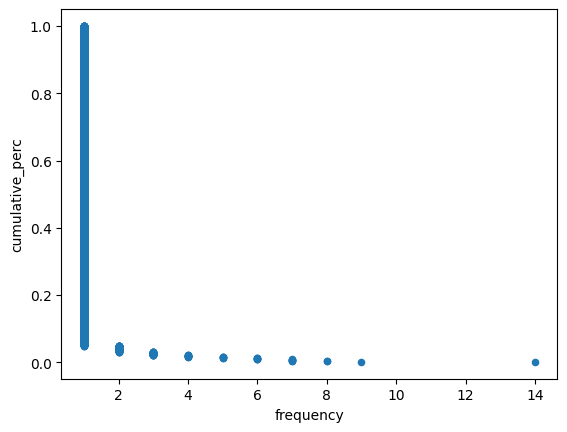

In [391]:
#Realizamos grafico de dispersion del dataframe filtrado
table9.plot("frequency", "cumulative_perc", kind="scatter")

In [54]:
table10= freq_tbl(df['price'])
table10

,price,frequency,percentage,cumulative_perc
0,Does not say,3790,0.392380,0.392380
1,$200.00,228,0.023605,0.415985
2,$250.00,190,0.019671,0.435656
3,$300.00,176,0.018221,0.453877
4,$350.00,131,0.013562,0.467440
...,...,...,...,...
614,$795.00,1,0.000104,0.999586
615,$780.00,1,0.000104,0.999689
616,"$2,500.00",1,0.000104,0.999793
617,"$1,785.00",1,0.000104,0.999896


In [392]:
#Elimina las columnas "percentage" y "cumulative_perc"
table10= table10.drop(['percentage','cumulative_perc'], axis=1)
table10

,price,frequency
0,Does not say,3790
1,$200.00,228
2,$250.00,190
3,$300.00,176
4,$350.00,131
...,...,...
614,$795.00,1
615,$780.00,1
616,"$2,500.00",1
617,"$1,785.00",1


In [394]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table10= table10[table10['frequency']>131]
table10

,price,frequency
0,Does not say,3790
1,$200.00,228
2,$250.00,190
3,$300.00,176


In [395]:
#Ajusto el indice de mi dataframe
table10= table10.set_index('price')
table10

,frequency
price,
Does not say,3790
$200.00,228
$250.00,190
$300.00,176


<Axes: ylabel='frequency'>

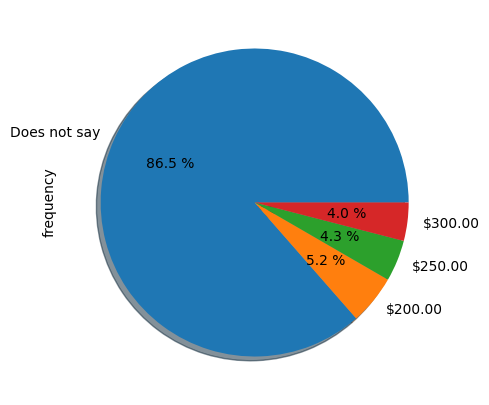

In [396]:
#Realizamos grafico de pastel
table10["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [55]:
table11= freq_tbl(df['has_availability'])
table11

,has_availability,frequency,percentage,cumulative_perc
0,t,9338,0.966767,0.966767
1,Has no information,310,0.032094,0.998861
2,f,11,0.001139,1.000000


In [397]:
#Elimina las columnas "percentage" y "cumulative_perc"
table11= table11.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table11= table11.set_index('has_availability')
table11

,frequency
has_availability,
t,9338
Has no information,310
f,11


Text(0, 0.5, 'Frecuencia')

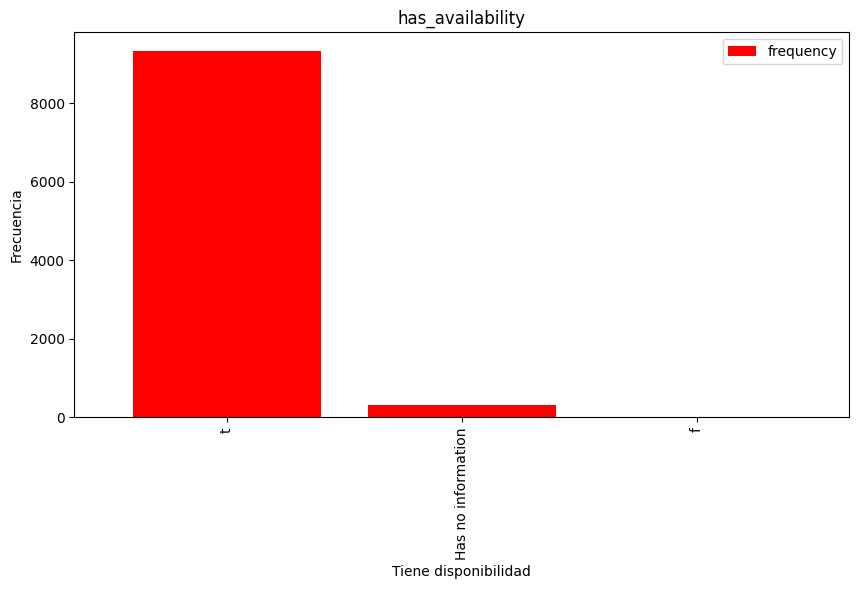

In [398]:
#Personalizamos grafico de barras
table11.plot(kind= 'bar', width=0.8, figsize=(10,5), color="red")
plt.title('has_availability')
plt.xlabel('Tiene disponibilidad')
plt.ylabel('Frecuencia')

In [56]:
table12= freq_tbl(df['last_review'])
table12

,last_review,frequency,percentage,cumulative_perc
0,Zero information,1027,0.106326,0.106326
1,2024-08-25,244,0.025261,0.131587
2,2024-08-26,199,0.020603,0.152190
3,2024-08-18,189,0.019567,0.171757
4,2024-09-01,184,0.019050,0.190807
...,...,...,...,...
1203,2023-05-25,1,0.000104,0.999586
1204,2018-11-23,1,0.000104,0.999689
1205,2021-11-02,1,0.000104,0.999793
1206,2020-02-03,1,0.000104,0.999896


In [399]:
#Elimina las columnas "percentage" y "cumulative_perc"
table12= table12.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table12= table12.set_index('last_review')
table12

,frequency
last_review,
Zero information,1027
2024-08-25,244
2024-08-26,199
2024-08-18,189
2024-09-01,184
...,...
2023-05-25,1
2018-11-23,1
2021-11-02,1


In [401]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table12= table12[table12['frequency']>184]
table12

,frequency
last_review,
Zero information,1027
2024-08-25,244
2024-08-26,199
2024-08-18,189


<Axes: ylabel='frequency'>

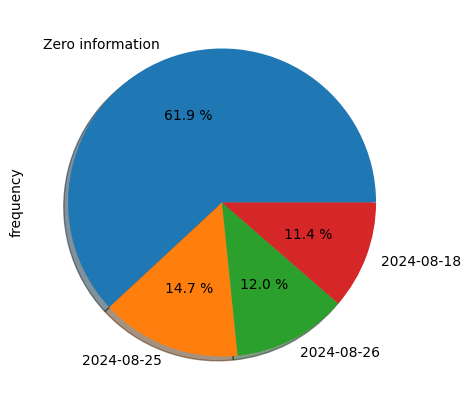

In [402]:
#Realizamos grafico de pastel
table12["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [57]:
table13= freq_tbl(df['review_scores_rating'])
table13

,review_scores_rating,frequency,percentage,cumulative_perc
0,5.0,3321,0.343824,0.343824
1,No information,1027,0.106326,0.450150
2,4.88,235,0.024330,0.474480
3,4.83,226,0.023398,0.497878
4,4.75,217,0.022466,0.520344
...,...,...,...,...
114,4.08,1,0.000104,0.999586
115,3.57,1,0.000104,0.999689
116,3.56,1,0.000104,0.999793
117,3.4,1,0.000104,0.999896


In [403]:
#Elimina las columnas "percentage" y "cumulative_perc"
table13= table13.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table13= table13.set_index('review_scores_rating')
table13

,frequency
review_scores_rating,
5.0,3321
No information,1027
4.88,235
4.83,226
4.75,217
...,...
4.08,1
3.57,1
3.56,1


In [404]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table13= table13[table13['frequency']>217]
table13

,frequency
review_scores_rating,
5.0,3321
No information,1027
4.88,235
4.83,226


Text(0, 0.5, 'Frecuencia')

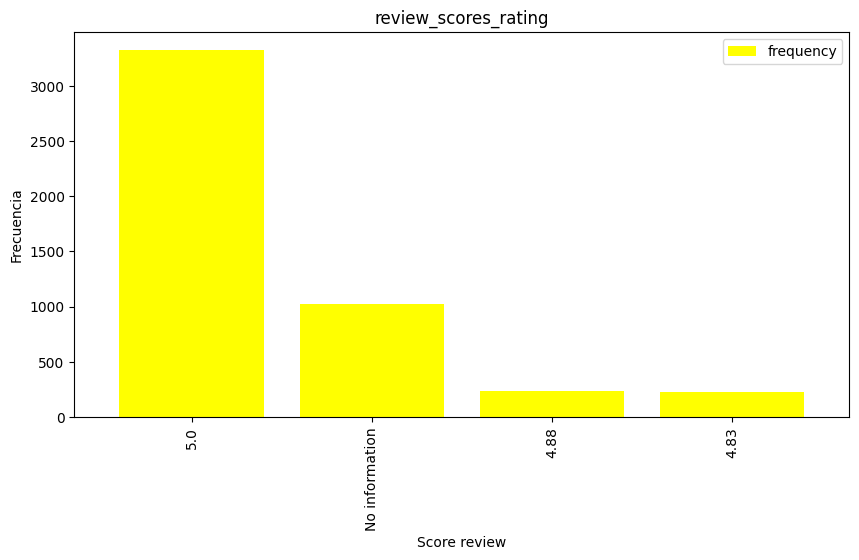

In [406]:
#Personalizamos grafico de barras
table13.plot(kind= 'bar', width=0.8, figsize=(10,5), color="yellow")
plt.title('review_scores_rating')
plt.xlabel('Score review')
plt.ylabel('Frecuencia')

In [59]:
table14= freq_tbl(df['review_scores_cleanliness'])
table14

,review_scores_cleanliness,frequency,percentage,cumulative_perc
0,5.0,2630,0.272285,0.272285
1,Nothing,1028,0.106429,0.378714
2,4.67,283,0.029299,0.408013
3,4.75,257,0.026607,0.434621
4,4.5,254,0.026297,0.460917
...,...,...,...,...
135,3.84,1,0.000104,0.999586
136,3.85,1,0.000104,0.999689
137,4.07,1,0.000104,0.999793
138,3.36,1,0.000104,0.999896


<Axes: xlabel='frequency', ylabel='cumulative_perc'>

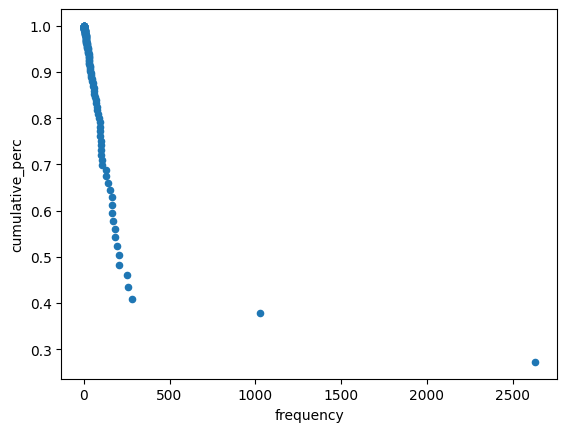

In [407]:
#Realizamos grafico de dispersion del dataframe filtrado
table14.plot("frequency", "cumulative_perc", kind="scatter")

In [60]:
table15= freq_tbl(df['review_scores_value'])
table15

,review_scores_value,frequency,percentage,cumulative_perc
0,5.0,1690,0.174966,0.174966
1,4.67,489,0.050626,0.225593
2,4.5,460,0.047624,0.273217
3,4.75,409,0.042344,0.315561
4,4.8,315,0.032612,0.348173
...,...,...,...,...
142,3.25,1,0.000104,0.999586
143,3.79,1,0.000104,0.999689
144,3.43,1,0.000104,0.999793
145,4.01,1,0.000104,0.999896


In [408]:
#Elimina las columnas "percentage" y "cumulative_perc"
table15= table15.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table15= table15.set_index('review_scores_value')
table15

,frequency
review_scores_value,
5.0,1690
4.67,489
4.5,460
4.75,409
4.8,315
...,...
3.25,1
3.79,1
3.43,1


In [409]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table15= table15[table15['frequency']>315]
table15

,frequency
review_scores_value,
5.0,1690
4.67,489
4.5,460
4.75,409


<Axes: ylabel='frequency'>

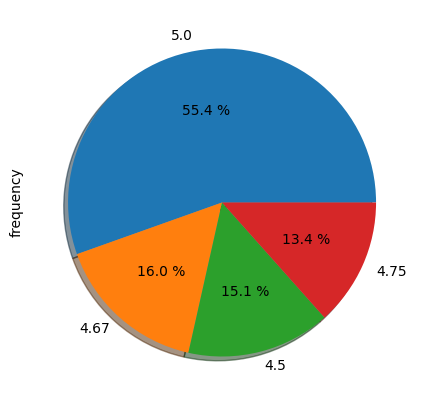

In [410]:
#Realizamos grafico de pastel
table15["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [61]:
table16= freq_tbl(df['instant_bookable'])
table16

,instant_bookable,frequency,percentage,cumulative_perc
0,f,8163,0.845119,0.845119
1,t,1496,0.154881,1.000000


In [411]:
#Elimina las columnas "percentage" y "cumulative_perc"
table16= table16.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table16= table16.set_index('instant_bookable')
table16

,frequency
instant_bookable,
f,8163
t,1496


Text(0, 0.5, 'Frecuencia')

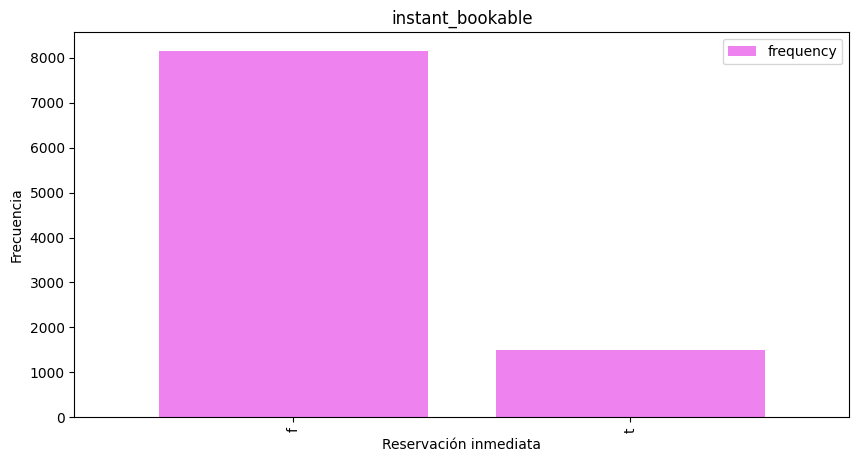

In [413]:
#Personalizamos grafico de barras
table16.plot(kind= 'bar', width=0.8, figsize=(10,5), color="violet")
plt.title('instant_bookable')
plt.xlabel('Reservación inmediata')
plt.ylabel('Frecuencia')

In [62]:
table17= freq_tbl(df['reviews_per_month'])
table17

,reviews_per_month,frequency,percentage,cumulative_perc
0,1.0,180,0.018635,0.018635
1,0.24,148,0.015322,0.033958
2,0.08,146,0.015115,0.049073
3,0.12,141,0.014598,0.063671
4,0.16,139,0.014391,0.078062
...,...,...,...,...
668,4.34,1,0.000104,0.999586
669,4.93,1,0.000104,0.999689
670,4.69,1,0.000104,0.999793
671,106.08,1,0.000104,0.999896


In [414]:
#Elimina las columnas "percentage" y "cumulative_perc"
table17= table17.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table17= table17.set_index('reviews_per_month')
table17

,frequency
reviews_per_month,
1.0,180
0.24,148
0.08,146
0.12,141
0.16,139
...,...
4.34,1
4.93,1
4.69,1


In [415]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table17= table17[table17['frequency']>139]
table17

,frequency
reviews_per_month,
1.0,180
0.24,148
0.08,146
0.12,141


<Axes: ylabel='frequency'>

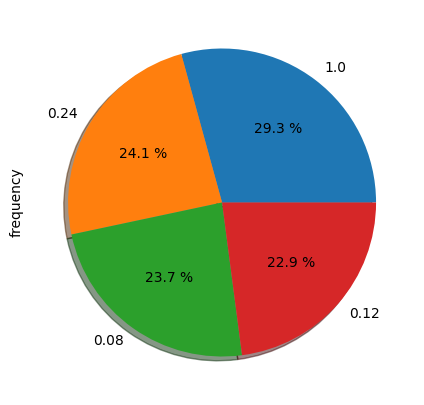

In [416]:
#Realizamos grafico de pastel
table17["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [64]:
table18= freq_tbl(df['host_location'])
table18

,host_location,frequency,percentage,cumulative_perc
0,"Amsterdam, Netherlands",7844,0.812092,0.812092
1,Not filled yet,1112,0.115126,0.927218
2,Netherlands,306,0.031680,0.958898
3,"Utrecht, Netherlands",21,0.002174,0.961073
4,"London, United Kingdom",17,0.001760,0.962833
...,...,...,...,...
191,"Istanbul, Turkey",1,0.000104,0.999586
192,"Lille, France",1,0.000104,0.999689
193,"Providence, RI",1,0.000104,0.999793
194,"Kamloops, Canada",1,0.000104,0.999896


In [417]:
#Elimina las columnas "percentage" y "cumulative_perc"
table18= table18.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table18= table18.set_index('host_location')
table18

,frequency
host_location,
"Amsterdam, Netherlands",7844
Not filled yet,1112
Netherlands,306
"Utrecht, Netherlands",21
"London, United Kingdom",17
...,...
"Istanbul, Turkey",1
"Lille, France",1
"Providence, RI",1


In [418]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table18= table18[table18['frequency']>17]
table18

,frequency
host_location,
"Amsterdam, Netherlands",7844
Not filled yet,1112
Netherlands,306
"Utrecht, Netherlands",21


Text(0, 0.5, 'Frecuencia')

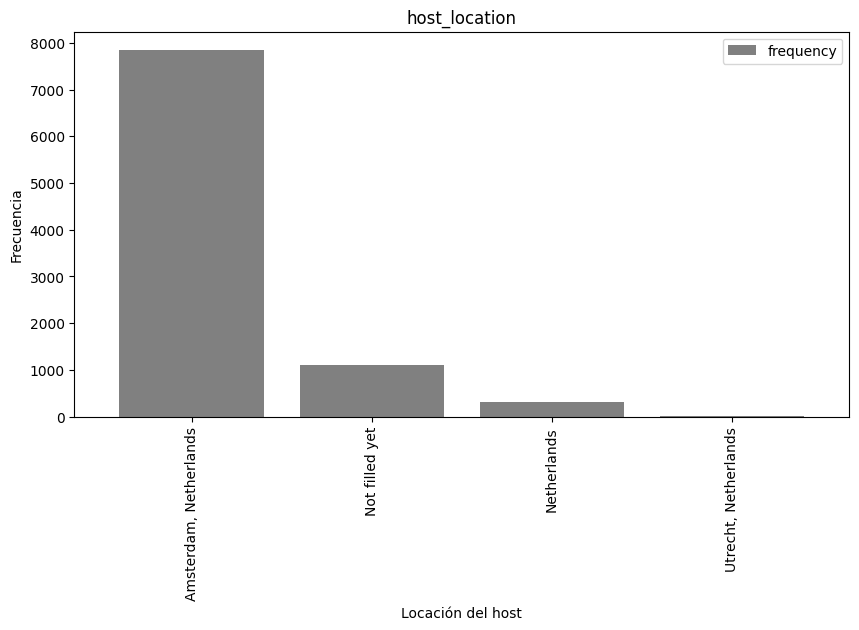

In [419]:
#Personalizamos grafico de barras
table18.plot(kind= 'bar', width=0.8, figsize=(10,5), color="gray")
plt.title('host_location')
plt.xlabel('Locación del host')
plt.ylabel('Frecuencia')

In [65]:
table19= freq_tbl(df['review_scores_checkin'])
table19

,review_scores_checkin,frequency,percentage,cumulative_perc
0,5.0,3843,0.397867,0.397867
1,Nothing,1027,0.106326,0.504193
2,4.94,258,0.026711,0.530904
3,4.93,254,0.026297,0.557201
4,4.92,249,0.025779,0.582980
...,...,...,...,...
102,3.6,1,0.000104,0.999586
103,4.22,1,0.000104,0.999689
104,3.86,1,0.000104,0.999793
105,4.2,1,0.000104,0.999896


In [420]:
#Elimina las columnas "percentage" y "cumulative_perc"
table19= table19.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table19= table19.set_index('review_scores_checkin')
table19

,frequency
review_scores_checkin,
5.0,3843
Nothing,1027
4.94,258
4.93,254
4.92,249
...,...
3.6,1
4.22,1
3.86,1


In [423]:
#Obtengo un filtro de los valores más relevantes de la variables categórica seleccionada
table19= table19[table19['frequency']>248]
table19

,frequency
review_scores_checkin,
5.0,3843
Nothing,1027
4.94,258
4.93,254
4.92,249


<Axes: ylabel='frequency'>

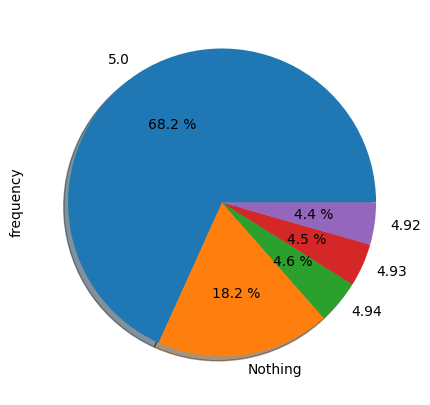

In [424]:
#Realizamos grafico de pastel
table19["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [66]:
table20= freq_tbl(df['review_scores_checkin'])
table20

,review_scores_checkin,frequency,percentage,cumulative_perc
0,5.0,3843,0.397867,0.397867
1,Nothing,1027,0.106326,0.504193
2,4.94,258,0.026711,0.530904
3,4.93,254,0.026297,0.557201
4,4.92,249,0.025779,0.582980
...,...,...,...,...
102,3.6,1,0.000104,0.999586
103,4.22,1,0.000104,0.999689
104,3.86,1,0.000104,0.999793
105,4.2,1,0.000104,0.999896


In [67]:
table20= table20[table20['frequency']>250]
table20

,review_scores_checkin,frequency,percentage,cumulative_perc
0,5.0,3843,0.397867,0.397867
1,Nothing,1027,0.106326,0.504193
2,4.94,258,0.026711,0.530904
3,4.93,254,0.026297,0.557201


In [425]:
#Elimina las columnas "percentage" y "cumulative_perc"
table20= table20.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table20= table20.set_index('review_scores_checkin')
table20

,frequency
review_scores_checkin,
5.0,3843
Nothing,1027
4.94,258
4.93,254


Text(0, 0.5, 'Frecuencia')

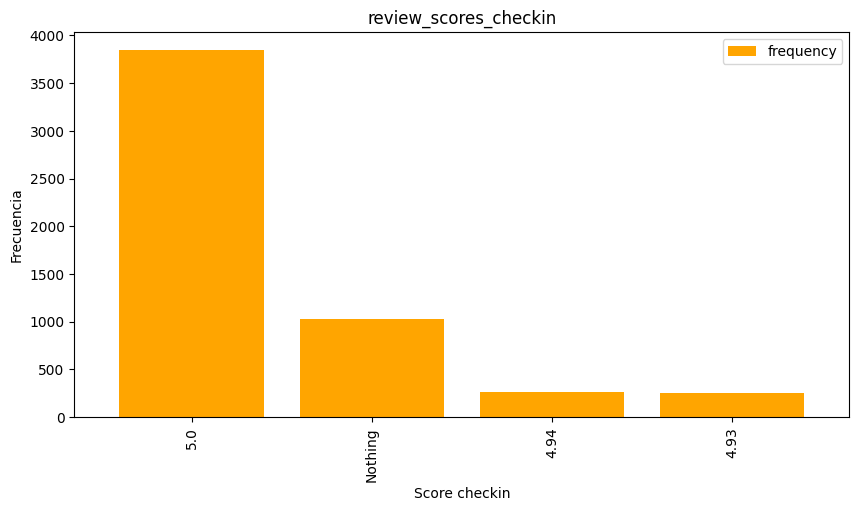

In [429]:
#Personalizamos grafico de barras
table20.plot(kind= 'bar', width=0.8, figsize=(10,5), color="orange")
plt.title('review_scores_checkin')
plt.xlabel('Score checkin')
plt.ylabel('Frecuencia')

In [235]:
df['accommodates'].info()
n=9659

<class 'pandas.core.series.Series'>
RangeIndex: 9659 entries, 0 to 9658
Series name: accommodates
Non-Null Count  Dtype  
--------------  -----  
9659 non-null   float64
dtypes: float64(1)
memory usage: 75.6 KB


In [236]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max= df['accommodates'].max()
Min= df['accommodates'].min()
Limites=[Min, Max]
Limites
#Calcular el Rango R
R= Max-Min
R
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni= 1+3.32*np.log10(n)
ni

14.229974791343807

In [237]:
#Calculamos el Ancho del Intervalo "i"
i= R/ni
i

0.421645160162184

In [257]:
#Categorización de variables
intervalos=np.linspace(Min,Max,15)
intervalos

array([1.        , 1.42857143, 1.85714286, 2.28571429, 2.71428571,
       3.14285714, 3.57142857, 4.        , 4.42857143, 4.85714286,
       5.28571429, 5.71428571, 6.14285714, 6.57142857, 7.        ])

In [241]:
#Creamos las categorías
categorias= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [242]:
#Finalmente creamos las categorías en la columna numérica
df['accommodates']= pd.cut(x=df['accommodates'],bins=intervalos,labels=categorias)
df['accommodates']

,accommodates
0,Categoria5
1,Categoria3
2,Categoria3
3,Categoria5
4,Categorias12
...,...
9654,Categoria5
9655,Categoria5
9656,Categoria7
9657,Categoria7


In [243]:
table21= freq_tbl(df['accommodates'])
table21

,accommodates,frequency,percentage,cumulative_perc
0,Categoria3,5094,0.527384,0.538706
1,Categoria7,3101,0.321048,0.866646
2,Categoria5,829,0.085827,0.954315
3,Categorias12,210,0.021741,0.976523
4,Categorias10,191,0.019774,0.996722
5,Categorias14,31,0.003209,1.000000
6,Categoria1,0,0.000000,1.000000
7,Categoria2,0,0.000000,1.000000
8,Categoria4,0,0.000000,1.000000
9,Categoria6,0,0.000000,1.000000


<Axes: ylabel='frequency'>

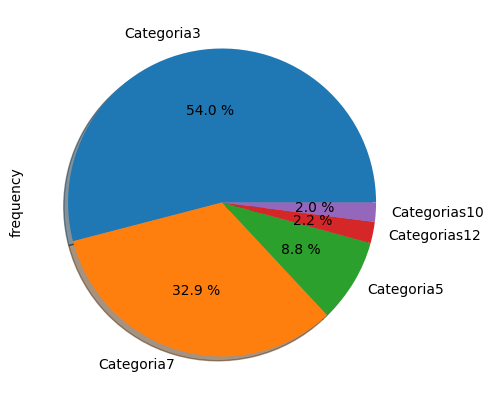

In [430]:
#Elimina las columnas "percentage" y "cumulative_perc"
table21= table21.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table21= table21.set_index('accommodates')
table21= table21[table21['frequency']>31]
#Realizamos grafico de pastel
table21["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [251]:
df['bedrooms'].info()
n=9659

<class 'pandas.core.series.Series'>
RangeIndex: 9659 entries, 0 to 9658
Series name: bedrooms
Non-Null Count  Dtype  
--------------  -----  
9659 non-null   float64
dtypes: float64(1)
memory usage: 75.6 KB


In [252]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max1= df['bedrooms'].max()
Min1= df['bedrooms'].min()
Limites1=[Min1, Max1]
Limites1
#Calcular el Rango R
R1= Max1-Min1
R1
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni1= 1+3.32*np.log10(n)
ni1

14.229974791343807

In [253]:
#Calculamos el Ancho del Intervalo "i"
i1= R1/ni1
i1

0.210822580081092

In [255]:
#Categorización de variables
intervalos1=np.linspace(Min,Max,15)
intervalos1

array([1.        , 1.42857143, 1.85714286, 2.28571429, 2.71428571,
       3.14285714, 3.57142857, 4.        , 4.42857143, 4.85714286,
       5.28571429, 5.71428571, 6.14285714, 6.57142857, 7.        ])

In [256]:
#Creamos las categorías
categorias1= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [258]:
#Finalmente creamos las categorías en la columna numérica
df['bedrooms']= pd.cut(x=df['bedrooms'],bins=intervalos1,labels=categorias1)
df['bedrooms']

,bedrooms
0,NaN
1,NaN
2,NaN
3,Categoria3
4,NaN
...,...
9654,Categoria3
9655,Categoria3
9656,Categoria3
9657,Categoria3


In [259]:
table22= freq_tbl(df['bedrooms'])
table22

,bedrooms,frequency,percentage,cumulative_perc
0,Categoria3,2401,0.248576,0.604481
1,Categoria5,943,0.097629,0.841893
2,Categoria2,628,0.065017,1.000000
3,Categoria1,0,0.000000,1.000000
4,Categoria4,0,0.000000,1.000000
5,Categoria6,0,0.000000,1.000000
6,Categoria7,0,0.000000,1.000000
7,Categoria8,0,0.000000,1.000000
8,Categorias9,0,0.000000,1.000000
9,Categorias10,0,0.000000,1.000000


Text(0, 0.5, 'Frecuencia')

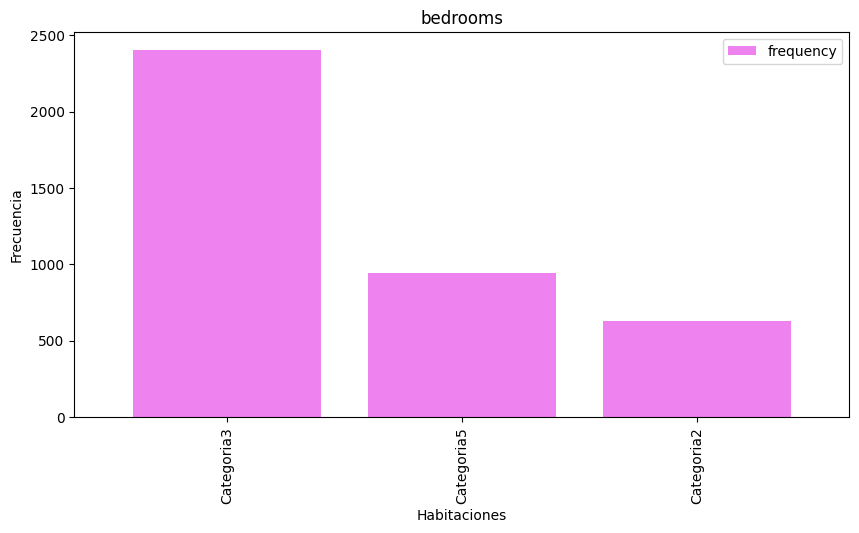

In [435]:
#Elimina las columnas "percentage" y "cumulative_perc"
#table22= table22.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
#table22= table22.set_index('bedrooms')
#table22= table22[table22['frequency']>0]
#Personalizamos grafico de barras
table22.plot(kind= 'bar', width=0.8, figsize=(10,5), color="violet")
plt.title('bedrooms')
plt.xlabel('Habitaciones')
plt.ylabel('Frecuencia')

In [260]:
df['minimum_nights'].info()
n=9659

<class 'pandas.core.series.Series'>
RangeIndex: 9659 entries, 0 to 9658
Series name: minimum_nights
Non-Null Count  Dtype  
--------------  -----  
9659 non-null   float64
dtypes: float64(1)
memory usage: 75.6 KB


In [261]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max2= df['minimum_nights'].max()
Min2= df['minimum_nights'].min()
Limites2=[Min2, Max2]
Limites2
#Calcular el Rango R
R2= Max2-Min2
R2
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni2= 1+3.32*np.log10(n)
ni2

14.229974791343807

In [263]:
#Calculamos el Ancho del Intervalo "i"
i2= R2/ni2
i2

0.421645160162184

In [264]:
#Categorización de variables
intervalos2=np.linspace(Min2,Max2,15)
intervalos2

array([1.        , 1.42857143, 1.85714286, 2.28571429, 2.71428571,
       3.14285714, 3.57142857, 4.        , 4.42857143, 4.85714286,
       5.28571429, 5.71428571, 6.14285714, 6.57142857, 7.        ])

In [265]:
#Creamos las categorías
categorias2= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [266]:
#Finalmente creamos las categorías en la columna numérica
df['minimum_nights']= pd.cut(x=df['minimum_nights'],bins=intervalos2,labels=categorias2)
df['minimum_nights']

,minimum_nights
0,Categoria3
1,Categoria3
2,Categoria5
3,Categoria5
4,NaN
...,...
9654,NaN
9655,Categoria3
9656,Categoria5
9657,Categoria7


In [268]:
table23= freq_tbl(df['minimum_nights'])
table23

,minimum_nights,frequency,percentage,cumulative_perc
0,Categoria5,3035,0.314215,0.382194
1,Categoria3,2774,0.287193,0.731520
2,Categoria7,1010,0.104566,0.858708
3,Categorias10,648,0.067088,0.940310
4,Categorias14,294,0.030438,0.977333
5,Categorias12,180,0.018635,1.000000
6,Categoria1,0,0.000000,1.000000
7,Categoria2,0,0.000000,1.000000
8,Categoria4,0,0.000000,1.000000
9,Categoria6,0,0.000000,1.000000


<Axes: ylabel='frequency'>

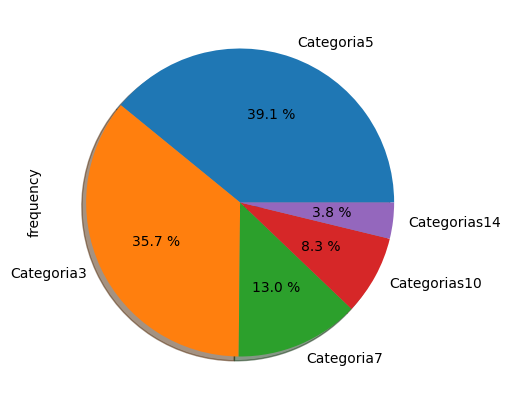

In [436]:
#Elimina las columnas "percentage" y "cumulative_perc"
table23= table23.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table23= table23.set_index('minimum_nights')
table23= table23[table23['frequency']>180]
#Realizamos grafico de pastel
table23["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [269]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max3= df['maximum_nights'].max()
Min3= df['maximum_nights'].min()
Limites3=[Min3, Max3]
Limites3
#Calcular el Rango R
R3= Max3-Min3
R3
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni3= 1+3.32*np.log10(n)
ni3

14.229974791343807

In [270]:
#Calculamos el Ancho del Intervalo "i"
i3= R3/ni3
i3

53.338112760516275

In [271]:
#Categorización de variables
intervalos3=np.linspace(Min3,Max3,15)
intervalos3

array([  1.        ,  55.21428571, 109.42857143, 163.64285714,
       217.85714286, 272.07142857, 326.28571429, 380.5       ,
       434.71428571, 488.92857143, 543.14285714, 597.35714286,
       651.57142857, 705.78571429, 760.        ])

In [272]:
#Creamos las categorías
categorias3= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [273]:
#Finalmente creamos las categorías en la columna numérica
df['maximum_nights']= pd.cut(x=df['maximum_nights'],bins=intervalos3,labels=categorias3)
df['maximum_nights']

,maximum_nights
0,Categoria3
1,Categoria3
2,Categoria3
3,Categoria1
4,Categoria3
...,...
9654,Categoria7
9655,Categoria1
9656,Categoria3
9657,Categoria7


In [274]:
table24= freq_tbl(df['maximum_nights'])
table24

,maximum_nights,frequency,percentage,cumulative_perc
0,Categoria1,5046,0.522414,0.523553
1,Categoria7,2137,0.221244,0.745279
2,Categoria3,1848,0.191324,0.937020
3,Categoria2,322,0.033337,0.970430
4,Categorias14,165,0.017083,0.987549
5,Categoria4,83,0.008593,0.996161
6,Categoria6,13,0.001346,0.997510
7,Categorias13,13,0.001346,0.998859
8,Categoria5,6,0.000621,0.999481
9,Categorias10,4,0.000414,0.999896


Text(0, 0.5, 'Frecuencia')

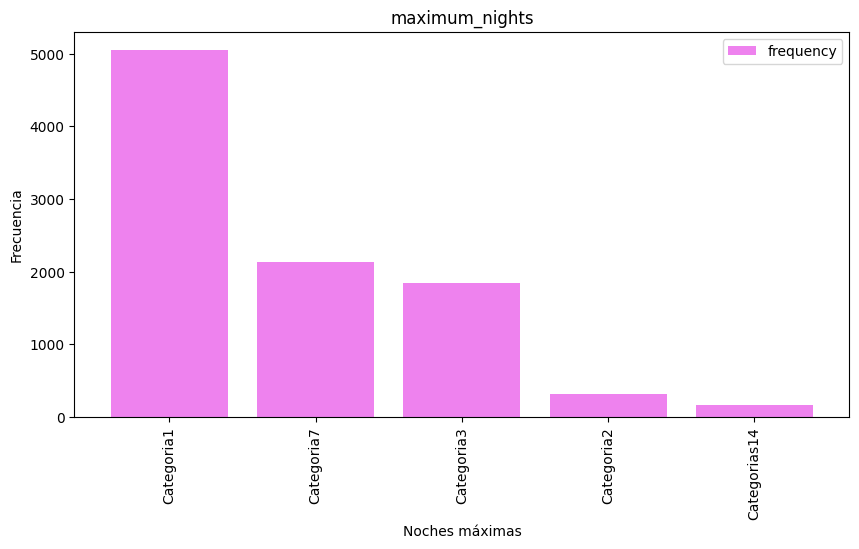

In [437]:
#Elimina las columnas "percentage" y "cumulative_perc"
table24= table24.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table24= table24.set_index('maximum_nights')
table24= table24[table24['frequency']>164]
#Personalizamos grafico de barras
table24.plot(kind= 'bar', width=0.8, figsize=(10,5), color="violet")
plt.title('maximum_nights')
plt.xlabel('Noches máximas')
plt.ylabel('Frecuencia')

In [275]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max4= df['minimum_minimum_nights'].max()
Min4= df['minimum_minimum_nights'].min()
Limites4=[Min4, Max4]
Limites4
#Calcular el Rango R
R4= Max4-Min4
R4
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni4= 1+3.32*np.log10(n)
ni4

14.229974791343807

In [276]:
#Calculamos el Ancho del Intervalo "i"
i4= R4/ni4
i4

0.210822580081092

In [277]:
#Categorización de variables
intervalos4=np.linspace(Min4,Max4,15)
intervalos4

array([1.        , 1.21428571, 1.42857143, 1.64285714, 1.85714286,
       2.07142857, 2.28571429, 2.5       , 2.71428571, 2.92857143,
       3.14285714, 3.35714286, 3.57142857, 3.78571429, 4.        ])

In [278]:
#Creamos las categorías
categorias4= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [279]:
#Finalmente creamos las categorías en la columna numérica
df['minimum_minimum_nights']= pd.cut(x=df['minimum_minimum_nights'],bins=intervalos4,labels=categorias4)
df['minimum_minimum_nights']

,minimum_minimum_nights
0,Categoria5
1,Categoria5
2,Categoria5
3,Categorias10
4,NaN
...,...
9654,NaN
9655,NaN
9656,Categoria5
9657,Categorias14


In [280]:
table25= freq_tbl(df['minimum_minimum_nights'])
table25

,minimum_minimum_nights,frequency,percentage,cumulative_perc
0,Categoria5,2831,0.293095,0.384490
1,Categorias10,2292,0.237292,0.695776
2,Categoria6,1334,0.138110,0.876952
3,Categorias14,906,0.093799,1.000000
4,Categoria1,0,0.000000,1.000000
5,Categoria2,0,0.000000,1.000000
6,Categoria3,0,0.000000,1.000000
7,Categoria4,0,0.000000,1.000000
8,Categoria7,0,0.000000,1.000000
9,Categoria8,0,0.000000,1.000000


<Axes: ylabel='frequency'>

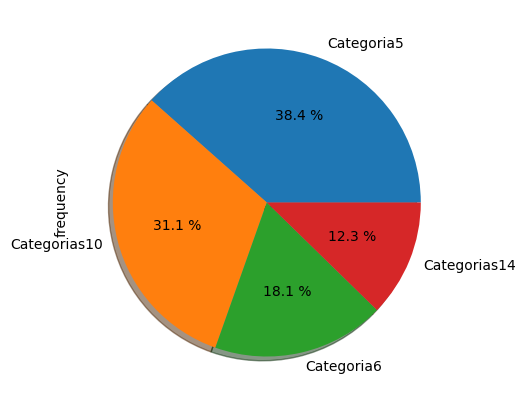

In [438]:
#Elimina las columnas "percentage" y "cumulative_perc"
table25= table25.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table25= table25.set_index('minimum_minimum_nights')
table25= table25[table25['frequency']>180]
#Realizamos grafico de pastel
table25["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [282]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max5= df['maximum_minimum_nights'].max()
Min5= df['maximum_minimum_nights'].min()
Limites5=[Min5, Max5]
Limites5
#Calcular el Rango R
R5= Max5-Min5
R5
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni5= 1+3.32*np.log10(n)
ni5

14.229974791343807

In [283]:
#Calculamos el Ancho del Intervalo "i"
i5= R5/ni5
i5

0.421645160162184

In [284]:
#Categorización de variables
intervalos5=np.linspace(Min5,Max5,15)
intervalos5

array([1.        , 1.42857143, 1.85714286, 2.28571429, 2.71428571,
       3.14285714, 3.57142857, 4.        , 4.42857143, 4.85714286,
       5.28571429, 5.71428571, 6.14285714, 6.57142857, 7.        ])

In [285]:
#Creamos las categorías
categorias5= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [286]:
#Finalmente creamos las categorías en la columna numérica
df['maximum_minimum_nights']= pd.cut(x=df['maximum_minimum_nights'],bins=intervalos5,labels=categorias5)
df['maximum_minimum_nights']

,maximum_minimum_nights
0,Categoria3
1,Categoria3
2,Categoria5
3,Categoria5
4,NaN
...,...
9654,NaN
9655,Categoria7
9656,Categoria5
9657,Categoria7


In [287]:
table26= freq_tbl(df['maximum_minimum_nights'])
table26

,maximum_minimum_nights,frequency,percentage,cumulative_perc
0,Categoria5,3497,0.362046,0.404933
1,Categoria3,2553,0.264313,0.700556
2,Categoria7,1227,0.127032,0.842635
3,Categorias10,784,0.081168,0.933418
4,Categorias14,343,0.035511,0.973136
5,Categorias12,232,0.024019,1.000000
6,Categoria1,0,0.000000,1.000000
7,Categoria2,0,0.000000,1.000000
8,Categoria4,0,0.000000,1.000000
9,Categoria6,0,0.000000,1.000000


Text(0, 0.5, 'Frecuencia')

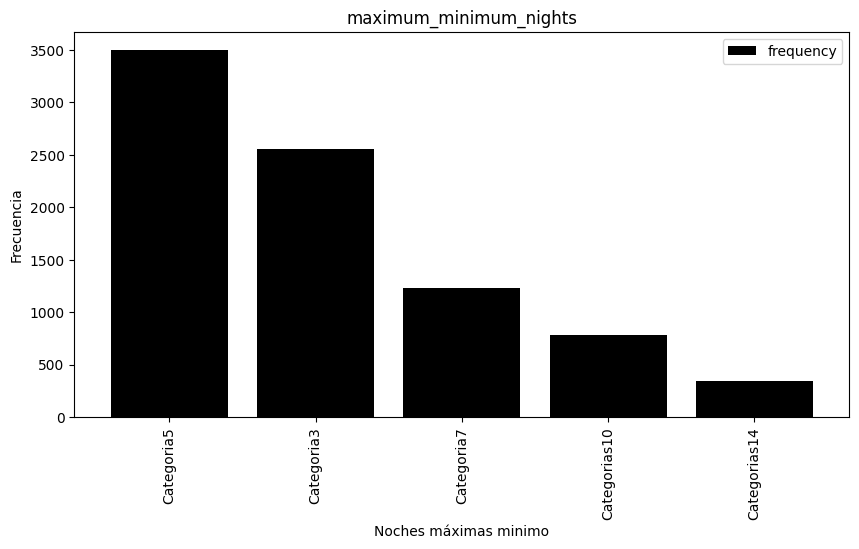

In [439]:
#Elimina las columnas "percentage" y "cumulative_perc"
table26= table26.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table26= table26.set_index('maximum_minimum_nights')
table26= table26[table26['frequency']>232]
#Personalizamos grafico de barras
table26.plot(kind= 'bar', width=0.8, figsize=(10,5), color="black")
plt.title('maximum_minimum_nights')
plt.xlabel('Noches máximas minimo')
plt.ylabel('Frecuencia')

In [288]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max6= df['minimum_maximum_nights'].max()
Min6= df['minimum_maximum_nights'].min()
Limites6=[Min6, Max6]
Limites6
#Calcular el Rango R
R6= Max6-Min6
R6
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni6= 1+3.32*np.log10(n)
ni6

14.229974791343807

In [289]:
#Calculamos el Ancho del Intervalo "i"
i6= R6/ni6
i6

78.98819333704913

In [290]:
#Categorización de variables
intervalos6=np.linspace(Min6,Max6,15)
intervalos6

array([1.00000000e+00, 8.12857143e+01, 1.61571429e+02, 2.41857143e+02,
       3.22142857e+02, 4.02428571e+02, 4.82714286e+02, 5.63000000e+02,
       6.43285714e+02, 7.23571429e+02, 8.03857143e+02, 8.84142857e+02,
       9.64428571e+02, 1.04471429e+03, 1.12500000e+03])

In [291]:
#Creamos las categorías
categorias6= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [292]:
#Finalmente creamos las categorías en la columna numérica
df['minimum_maximum_nights']= pd.cut(x=df['minimum_maximum_nights'],bins=intervalos6,labels=categorias6)
df['minimum_maximum_nights']

,minimum_maximum_nights
0,Categorias14
1,Categorias14
2,Categorias14
3,Categoria1
4,Categorias14
...,...
9654,Categoria5
9655,Categoria1
9656,Categorias14
9657,Categoria5


In [293]:
table27= freq_tbl(df['minimum_maximum_nights'])
table27

,minimum_maximum_nights,frequency,percentage,cumulative_perc
0,Categoria1,4725,0.489181,0.491727
1,Categorias14,2472,0.255927,0.748985
2,Categoria5,1803,0.186665,0.936622
3,Categorias13,188,0.019464,0.956187
4,Categorias10,159,0.016461,0.972734
5,Categoria2,142,0.014701,0.987512
6,Categoria3,89,0.009214,0.996774
7,Categorias9,14,0.001449,0.998231
8,Categoria4,12,0.001242,0.999480
9,Categoria7,4,0.000414,0.999896


<Axes: ylabel='frequency'>

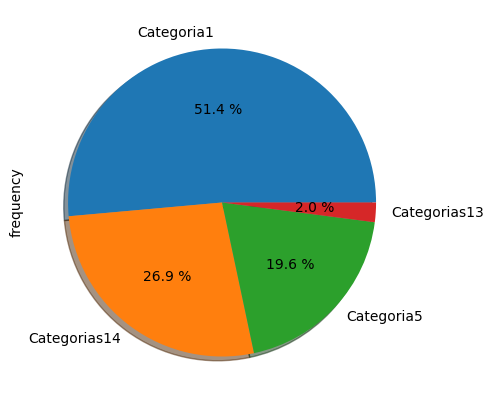

In [440]:
#Elimina las columnas "percentage" y "cumulative_perc"
table27= table27.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table27= table27.set_index('minimum_maximum_nights')
table27= table27[table27['frequency']>180]
#Realizamos grafico de pastel
table27["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [294]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max7= df['maximum_maximum_nights'].max()
Min7= df['maximum_maximum_nights'].min()
Limites7=[Min7, Max7]
Limites7
#Calcular el Rango R
R7= Max7-Min7
R7
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni7= 1+3.32*np.log10(n)
ni7

14.229974791343807

In [295]:
#Calculamos el Ancho del Intervalo "i"
i7= R7/ni7
i7

78.98819333704913

In [296]:
#Categorización de variables
intervalos7=np.linspace(Min7,Max7,15)
intervalos7

array([1.00000000e+00, 8.12857143e+01, 1.61571429e+02, 2.41857143e+02,
       3.22142857e+02, 4.02428571e+02, 4.82714286e+02, 5.63000000e+02,
       6.43285714e+02, 7.23571429e+02, 8.03857143e+02, 8.84142857e+02,
       9.64428571e+02, 1.04471429e+03, 1.12500000e+03])

In [297]:
#Creamos las categorías
categorias7= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [298]:
#Finalmente creamos las categorías en la columna numérica
df['maximum_maximum_nights']= pd.cut(x=df['maximum_maximum_nights'],bins=intervalos7,labels=categorias7)
df['maximum_maximum_nights']

,maximum_maximum_nights
0,Categorias14
1,Categorias14
2,Categorias14
3,Categoria1
4,Categorias14
...,...
9654,Categoria5
9655,Categoria1
9656,Categorias14
9657,Categoria5


In [299]:
table28= freq_tbl(df['maximum_maximum_nights'])
table28

,maximum_maximum_nights,frequency,percentage,cumulative_perc
0,Categoria1,4593,0.475515,0.476353
1,Categorias14,2565,0.265555,0.742377
2,Categoria5,1819,0.188322,0.931031
3,Categorias10,216,0.022363,0.953433
4,Categorias13,201,0.020810,0.974279
5,Categoria2,143,0.014805,0.989110
6,Categoria3,67,0.006937,0.996059
7,Categorias9,19,0.001967,0.998029
8,Categoria4,12,0.001242,0.999274
9,Categoria7,4,0.000414,0.999689


Text(0, 0.5, 'Frecuencia')

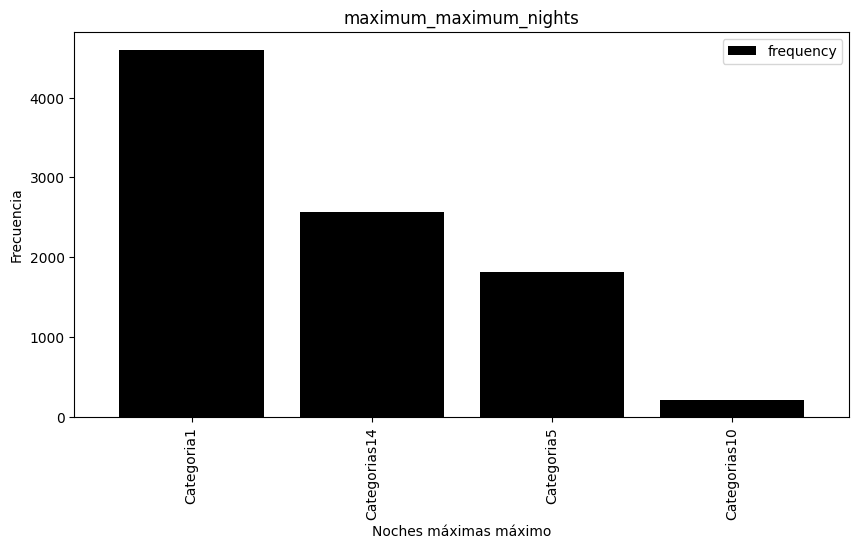

In [441]:
#Elimina las columnas "percentage" y "cumulative_perc"
table28= table28.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table28= table28.set_index('maximum_maximum_nights')
table28= table28[table28['frequency']>201]
#Personalizamos grafico de barras
table28.plot(kind= 'bar', width=0.8, figsize=(10,5), color="black")
plt.title('maximum_maximum_nights')
plt.xlabel('Noches máximas máximo')
plt.ylabel('Frecuencia')

In [300]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max8= df['minimum_nights_avg_ntm'].max()
Min8= df['minimum_nights_avg_ntm'].min()
Limites8=[Min8, Max8]
Limites8
#Calcular el Rango R
R8= Max8-Min8
R8
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni8= 1+3.32*np.log10(n)
ni8

14.229974791343807

In [301]:
#Calculamos el Ancho del Intervalo "i"
i8= R8/ni8
i8

0.421645160162184

In [302]:
#Categorización de variables
intervalos8=np.linspace(Min8,Max8,15)
intervalos8

array([1.        , 1.42857143, 1.85714286, 2.28571429, 2.71428571,
       3.14285714, 3.57142857, 4.        , 4.42857143, 4.85714286,
       5.28571429, 5.71428571, 6.14285714, 6.57142857, 7.        ])

In [303]:
#Creamos las categorías
categorias8= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [304]:
#Finalmente creamos las categorías en la columna numérica
df['minimum_nights_avg_ntm']= pd.cut(x=df['minimum_nights_avg_ntm'],bins=intervalos8,labels=categorias8)
df['minimum_nights_avg_ntm']

,minimum_nights_avg_ntm
0,Categoria3
1,Categoria3
2,Categoria4
3,Categoria5
4,NaN
...,...
9654,NaN
9655,Categoria3
9656,Categoria5
9657,Categoria7


In [305]:
table29= freq_tbl(df['minimum_nights_avg_ntm'])
table29

,minimum_nights_avg_ntm,frequency,percentage,cumulative_perc
0,Categoria5,2978,0.308313,0.349613
1,Categoria3,2682,0.277668,0.664475
2,Categoria7,998,0.103323,0.781639
3,Categorias10,640,0.066259,0.856774
4,Categorias14,294,0.030438,0.891289
5,Categoria1,266,0.027539,0.922517
6,Categoria4,262,0.027125,0.953275
7,Categorias12,181,0.018739,0.974525
8,Categoria6,68,0.007040,0.982508
9,Categoria2,62,0.006419,0.989786


<Axes: ylabel='frequency'>

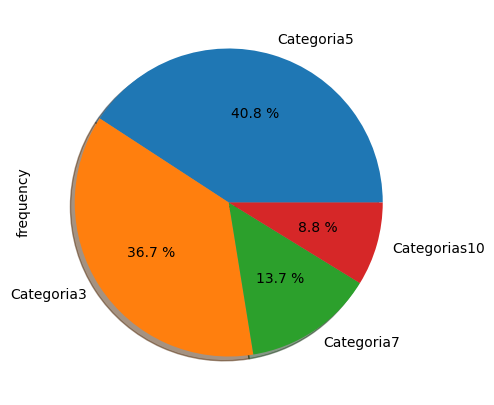

In [442]:
#Elimina las columnas "percentage" y "cumulative_perc"
table29= table29.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table29= table29.set_index('minimum_nights_avg_ntm')
table29= table29[table29['frequency']>294]
#Realizamos grafico de pastel
table29["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [306]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max9= df['availability_30'].max()
Min9= df['availability_30'].min()
Limites9=[Min9, Max9]
Limites9
#Calcular el Rango R
R9= Max9-Min9
R9
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni9= 1+3.32*np.log10(n)
ni9

14.229974791343807

In [307]:
#Calculamos el Ancho del Intervalo "i"
i9= R9/ni9
i9

1.194661287126188

In [308]:
#Categorización de variables
intervalos9=np.linspace(Min9,Max9,15)
intervalos9

array([ 0.        ,  1.21428571,  2.42857143,  3.64285714,  4.85714286,
        6.07142857,  7.28571429,  8.5       ,  9.71428571, 10.92857143,
       12.14285714, 13.35714286, 14.57142857, 15.78571429, 17.        ])

In [309]:
#Creamos las categorías
categorias9= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [310]:
#Finalmente creamos las categorías en la columna numérica
df['availability_30']= pd.cut(x=df['availability_30'],bins=intervalos9,labels=categorias9)
df['availability_30']

,availability_30
0,NaN
1,NaN
2,NaN
3,NaN
4,Categoria5
...,...
9654,Categoria2
9655,Categorias14
9656,Categoria1
9657,Categorias10


In [311]:
table30= freq_tbl(df['availability_30'])
table30

,availability_30,frequency,percentage,cumulative_perc
0,Categoria3,1342,0.138938,0.297891
1,Categoria5,515,0.053318,0.412209
2,Categoria1,468,0.048452,0.516093
3,Categoria2,353,0.036546,0.594451
4,Categoria4,353,0.036546,0.672808
5,Categorias10,264,0.027332,0.731410
6,Categoria6,216,0.022363,0.779356
7,Categoria7,198,0.020499,0.823307
8,Categorias14,192,0.019878,0.865927
9,Categoria8,182,0.018843,0.906326


Text(0, 0.5, 'Frecuencia')

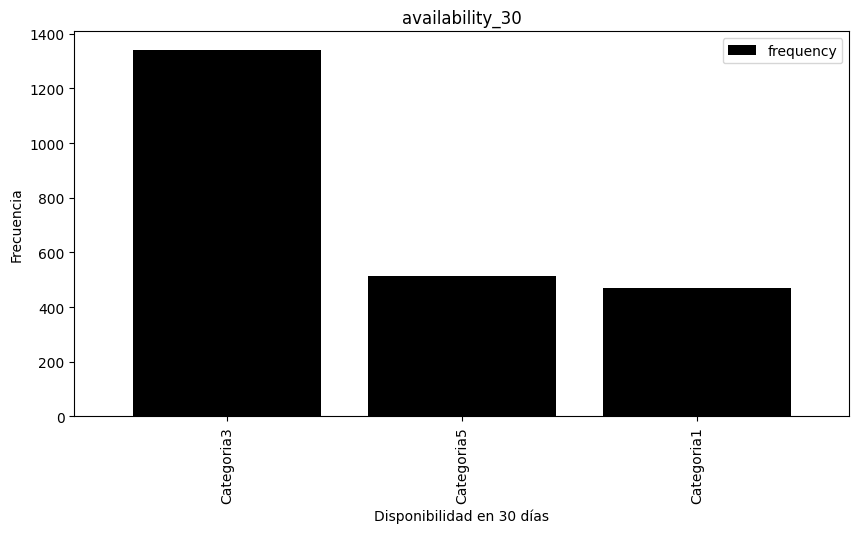

In [443]:
#Elimina las columnas "percentage" y "cumulative_perc"
table30= table30.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table30= table30.set_index('availability_30')
table30= table30[table30['frequency']>353]
#Personalizamos grafico de barras
table30.plot(kind= 'bar', width=0.8, figsize=(10,5), color="black")
plt.title('availability_30')
plt.xlabel('Disponibilidad en 30 días')
plt.ylabel('Frecuencia')

In [312]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max10= df['availability_60'].max()
Min10= df['availability_60'].min()
Limites10=[Min10, Max10]
Limites10
#Calcular el Rango R
R10= Max10-Min10
R10
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni10= 1+3.32*np.log10(n)
ni10

14.229974791343807

In [313]:
#Calculamos el Ancho del Intervalo "i"
i10= R10/ni10
i10

3.302887087937108

In [314]:
#Categorización de variables
intervalos10=np.linspace(Min10,Max10,15)
intervalos10

array([ 0.        ,  3.35714286,  6.71428571, 10.07142857, 13.42857143,
       16.78571429, 20.14285714, 23.5       , 26.85714286, 30.21428571,
       33.57142857, 36.92857143, 40.28571429, 43.64285714, 47.        ])

In [315]:
#Creamos las categorías
categorias10= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [316]:
#Finalmente creamos las categorías en la columna numérica
df['availability_60']= pd.cut(x=df['availability_60'],bins=intervalos10,labels=categorias10)
df['availability_60']

,availability_60
0,NaN
1,NaN
2,NaN
3,NaN
4,Categoria6
...,...
9654,Categoria5
9655,Categorias13
9656,Categoria4
9657,Categoria8


In [317]:
table31= freq_tbl(df['availability_60'])
table31

,availability_60,frequency,percentage,cumulative_perc
0,Categoria3,1406,0.145564,0.270541
1,Categoria1,732,0.075784,0.411391
2,Categoria2,521,0.053939,0.511641
3,Categoria4,352,0.036443,0.579373
4,Categoria6,334,0.034579,0.643641
5,Categoria5,287,0.029713,0.698865
6,Categorias9,258,0.026711,0.748509
7,Categoria7,223,0.023087,0.791418
8,Categoria8,204,0.021120,0.830672
9,Categorias12,194,0.020085,0.868001


<Axes: ylabel='frequency'>

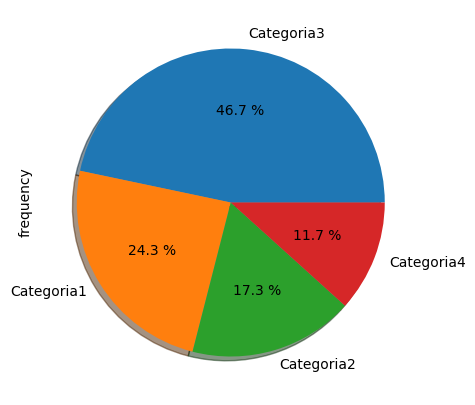

In [444]:
#Elimina las columnas "percentage" y "cumulative_perc"
table31= table31.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table31= table31.set_index('availability_60')
table31= table31[table31['frequency']>334]
#Realizamos grafico de pastel
table31["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")

In [318]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max11= df['availability_90'].max()
Min11= df['availability_90'].min()
Limites11=[Min11, Max11]
Limites11
#Calcular el Rango R
R11= Max11-Min11
R11
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni11= 1+3.32*np.log10(n)
ni11

14.229974791343807

In [319]:
#Calculamos el Ancho del Intervalo "i"
i11= R11/ni11
i11

6.324677402432759

In [320]:
#Categorización de variables
intervalos11=np.linspace(Min11,Max11,15)
intervalos11

array([ 0.        ,  6.42857143, 12.85714286, 19.28571429, 25.71428571,
       32.14285714, 38.57142857, 45.        , 51.42857143, 57.85714286,
       64.28571429, 70.71428571, 77.14285714, 83.57142857, 90.        ])

In [321]:
#Creamos las categorías
categorias11= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [322]:
#Finalmente creamos las categorías en la columna numérica
df['availability_90']= pd.cut(x=df['availability_90'],bins=intervalos11,labels=categorias11)
df['availability_90']

,availability_90
0,NaN
1,NaN
2,NaN
3,NaN
4,Categoria8
...,...
9654,Categoria7
9655,Categorias12
9656,Categoria2
9657,Categorias9


In [323]:
table32= freq_tbl(df['availability_90'])
table32

,availability_90,frequency,percentage,cumulative_perc
0,Categoria1,1024,0.106015,0.188965
1,Categoria2,626,0.064810,0.304484
2,Categorias14,407,0.042137,0.379590
3,Categoria3,406,0.042033,0.454512
4,Categoria7,357,0.036960,0.520391
5,Categoria5,332,0.034372,0.581657
6,Categorias10,316,0.032716,0.639970
7,Categoria6,305,0.031577,0.696254
8,Categorias13,302,0.031266,0.751984
9,Categoria4,294,0.030438,0.806237


Text(0, 0.5, 'Frecuencia')

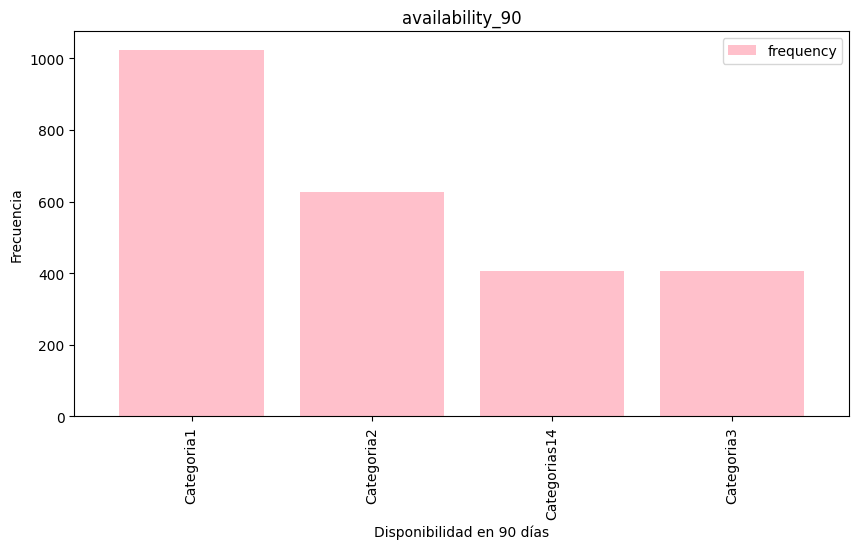

In [445]:
#Elimina las columnas "percentage" y "cumulative_perc"
table32= table32.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table32= table32.set_index('availability_90')
table32= table32[table32['frequency']>357]
#Personalizamos grafico de barras
table32.plot(kind= 'bar', width=0.8, figsize=(10,5), color="pink")
plt.title('availability_90')
plt.xlabel('Disponibilidad en 90 días')
plt.ylabel('Frecuencia')

In [326]:
#Obtenemos el límite superior e inferior de la columna objetivo
Max12= df['number_of_reviews_ltm'].max()
Min12= df['number_of_reviews_ltm'].min()
Limites12=[Min12, Max12]
Limites12
#Calcular el Rango R
R12= Max12-Min12
R12
#Calculamos el número de intervalos de Clase "ni", aplicando la regla de Sturges
ni12= 1+3.32*np.log10(n)
ni12

14.229974791343807

In [327]:
#Calculamos el Ancho del Intervalo "i"
i12= R12/ni12
i12

1.194661287126188

In [328]:
#Categorización de variables
intervalos12=np.linspace(Min12,Max12,15)
intervalos12

array([ 0.        ,  1.21428571,  2.42857143,  3.64285714,  4.85714286,
        6.07142857,  7.28571429,  8.5       ,  9.71428571, 10.92857143,
       12.14285714, 13.35714286, 14.57142857, 15.78571429, 17.        ])

In [330]:
#Creamos las categorías
categorias12= ["Categoria1","Categoria2","Categoria3","Categoria4","Categoria5","Categoria6","Categoria7","Categoria8","Categorias9","Categorias10","Categorias11","Categorias12","Categorias13","Categorias14"]

In [331]:
#Finalmente creamos las categorías en la columna numérica
df['number_of_reviews_ltm']= pd.cut(x=df['number_of_reviews_ltm'],bins=intervalos12,labels=categorias12)
df['number_of_reviews_ltm']

,number_of_reviews_ltm
0,NaN
1,NaN
2,Categoria7
3,NaN
4,Categoria3
...,...
9654,NaN
9655,NaN
9656,Categoria5
9657,NaN


In [332]:
table33= freq_tbl(df['number_of_reviews_ltm'])
table33

,number_of_reviews_ltm,frequency,percentage,cumulative_perc
0,Categoria3,2036,0.210788,0.306765
1,Categoria1,1002,0.103737,0.457737
2,Categoria5,936,0.096904,0.598765
3,Categoria2,832,0.086137,0.724122
4,Categoria4,595,0.061601,0.813771
5,Categoria6,310,0.032094,0.860479
6,Categoria7,226,0.023398,0.894531
7,Categoria8,166,0.017186,0.919542
8,Categorias10,165,0.017083,0.944403
9,Categorias9,120,0.012424,0.962483


<Axes: ylabel='frequency'>

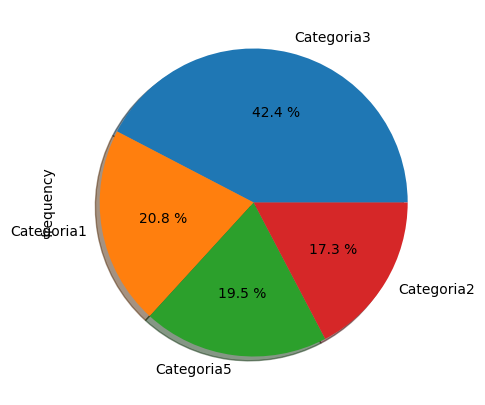

In [446]:
#Elimina las columnas "percentage" y "cumulative_perc"
table33= table33.drop(['percentage','cumulative_perc'], axis=1)
#Ajusto el indice de mi dataframe
table33= table33.set_index('number_of_reviews_ltm')
table33= table33[table33['frequency']>595]
#Realizamos grafico de pastel
table33["frequency"].plot(kind='pie', figsize=(10,5), shadow= True, autopct="%0.1f %%")